__генеративно-состязательные модели (GAN)__

Евгений Борисов esborisov@sevsu.ru

---

Image-to-Image Translation with Conditional Adversarial Networks   
Phillip Isola Jun-Yan Zhu Tinghui Zhou Alexei A. Efros   
2018  

https://arxiv.org/pdf/1611.07004.pdf

Generative adversarial networks   
Max Strakhov   
2018

https://habr.com/ru/post/352794/



Pix2Pix – Image-to-Image Translation Neural Network   
2018


https://neurohive.io/en/popular-networks/pix2pix-image-to-image-translation/

https://github.com/YunYang1994/TensorFlow2.0-Examples/tree/master/6-Generative_Adversarial_Networks

----

In [1]:
import time
import numpy as np
import matplotlib.pyplot as plt
# from matplotlib import cm

In [2]:
import tensorflow as tf
tf.__version__, tf.keras.__version__, 

('2.4.1', '2.4.0')

In [3]:
# !wget -c https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/facades.tar.gz

In [4]:
PATH = '../data/facades'

In [5]:
BUFFER_SIZE = 1400
EPOCHS = 90
BATCH_SIZE = 1
IMG_WIDTH, IMG_HEIGHT, OUTPUT_CHANNELS = 256,256,3

In [6]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image)

    w = tf.shape(image)[1]
    w = w // 2
    real_image  = image[:, :w, :]
    input_image = image[:, w:, :]
    input_image = tf.cast(input_image, tf.float32)
    real_image  = tf.cast(real_image, tf.float32)

    return input_image, real_image

In [7]:
def resize(input_image, real_image, height, width):

    input_image = tf.image.resize(input_image, [height, width],
                                  method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image  = tf.image.resize(real_image, [height, width],
                                  method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    return input_image, real_image

In [8]:
def random_crop(input_image, real_image):

    stacked_image = tf.stack([input_image, real_image], axis=0)
    cropped_image = tf.image.random_crop(
        stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

    return cropped_image[0], cropped_image[1]

In [9]:
# normalizing the images to [-1, 1]
def normalize(input_image, real_image):
    input_image = (input_image / 127.5) - 1.
    real_image  = (real_image  / 127.5) - 1.
    return input_image, real_image

In [10]:
@tf.function()
def random_jitter(input_image, real_image):
    # resizing to 286 x 286 x 3
    input_image, real_image = resize(input_image, real_image, 286, 286)
    # randomly cropping to 256 x 256 x 3
    input_image, real_image = random_crop(input_image, real_image)

    # random mirroring
    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_left_right(input_image)
        real_image = tf.image.flip_left_right(real_image)

    return input_image, real_image

In [11]:
def load_image_train(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = random_jitter(input_image, real_image)
    input_image, real_image = normalize(input_image, real_image)

    return input_image, real_image

In [12]:
def load_image_test(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = resize(input_image, real_image,  IMG_HEIGHT, IMG_WIDTH)
    input_image, real_image = normalize(input_image, real_image)

    return input_image, real_image

In [19]:
train_dataset = tf.data.Dataset.list_files(PATH+'/train/*.jpg')
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.batch(1)

In [20]:
# !ls ../data/facades/

In [21]:
test_dataset = tf.data.Dataset.list_files(PATH+'/test/*.jpg')
test_dataset = test_dataset.shuffle(BUFFER_SIZE)
test_dataset = test_dataset.map(load_image_test, num_parallel_calls=tf.data.experimental.AUTOTUNE)
test_dataset = test_dataset.batch(1)

In [22]:
# Build the Generator
def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(tf.keras.layers.Conv2D( filters, size, strides=2, padding='same',
                                        kernel_initializer=initializer, use_bias=False))
    
    if apply_batchnorm: result.add(tf.keras.layers.BatchNormalization())

    result.add(tf.keras.layers.LeakyReLU())
    
    return result

In [23]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add( tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))
    result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())
    return result

In [24]:
def Generator():
    down_stack = [
        downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
        downsample(128, 4), # (bs, 64, 64, 128)
        downsample(256, 4), # (bs, 32, 32, 256)
        downsample(512, 4), # (bs, 16, 16, 512)
        downsample(512, 4), # (bs, 8, 8, 512)
        downsample(512, 4), # (bs, 4, 4, 512)
        downsample(512, 4), # (bs, 2, 2, 512)
        downsample(512, 4), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
        upsample(512, 4), # (bs, 16, 16, 1024)
        upsample(256, 4), # (bs, 32, 32, 512)
        upsample(128, 4), # (bs, 64, 64, 256)
        upsample(64, 4), # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh') # (bs, 256, 256, 3)
    concat = tf.keras.layers.Concatenate()

    inputs = tf.keras.layers.Input(shape=[None,None,3])
    x = inputs
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

generator = Generator()

In [25]:
# Build the Discriminator
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    inp = tf.keras.layers.Input(shape=[None, None, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[None, None, 3], name='target_image')

    x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

    down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=[inp, tar], outputs=last)


discriminator = Discriminator()

In [26]:
# Define the loss functions and the optimizer
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [27]:
def discriminator_loss(disc_real_output, disc_generated_output):

    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss

In [28]:
def generator_loss(disc_generated_output, gen_output, target):
    LAMBDA = 100
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)
    # mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss

In [29]:
!mkdir -p ./gan-pix2pix/training_checkpoints/ckpt

In [30]:
generator_optimizer     = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

# Checkpoints (Object-based saving)
checkpoint_dir = './gan-pix2pix/training_checkpoints'
checkpoint_prefix = checkpoint_dir + '/ckpt'

checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [31]:
def generate_images(model, test_input, tar):
    # the training=True is intentional here since
    # we want the batch statistics while running the model
    # on the test dataset. If we use training=False, we will get
    # the accumulated statistics learned from the training dataset
    # (which we don't want)
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15,15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # getting the pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

In [32]:
@tf.function
def train_step(input_image, target):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)
        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

In [33]:
# from IPython.display import clear_output

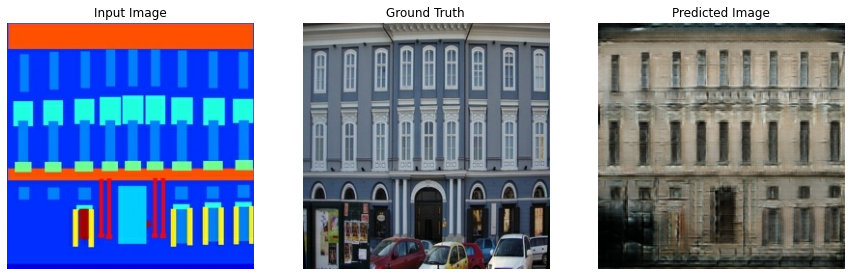

=> Time taken for epoch 1 is 48.47076201438904 sec



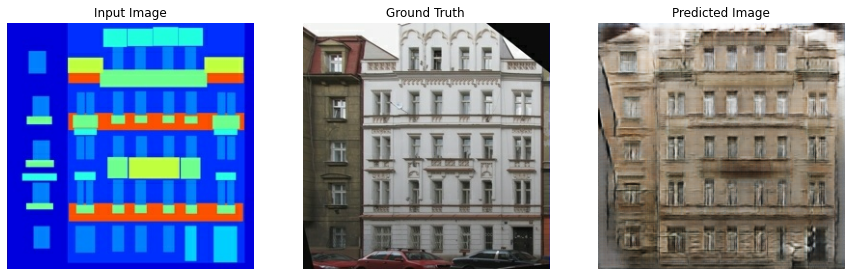

=> Time taken for epoch 2 is 49.75687551498413 sec

CPU times: user 46.2 s, sys: 1.74 s, total: 47.9 s
Wall time: 1min 38s


In [36]:
%%time

for epoch in range(EPOCHS):
    start = time.time()
    
    for input_image, target in train_dataset: train_step(input_image, target)

    # clear_output(wait=True)
    
    for inp, tar in test_dataset.take(1):  generate_images(generator, inp, tar)
        
    # saving (checkpoint) the model every 20 epochs
    if (epoch + 1) % 20 == 0: checkpoint.save(file_prefix = checkpoint_prefix)
        
    print ('=> Time taken for epoch {} is {} sec\n'.format(epoch + 1, time.time()-start))

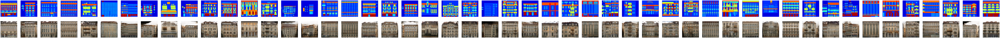

In [37]:
from matplotlib import pyplot as plt

def tensor2img(t): 
    x = t.numpy().reshape([IMG_WIDTH, IMG_HEIGHT, OUTPUT_CHANNELS])
    return np.floor((x+1.)*127.5).astype(np.uint8)

n_samples = 50

fig, axes = plt.subplots(2, n_samples,figsize=(5*n_samples,10) ) 

for n,(inp, _) in enumerate(test_dataset.take(n_samples)):
    t = generator(inp, training=False)
    axes[0][n].axis(False)
    axes[0][n].imshow( tensor2img(inp) )
    
    axes[1][n].axis(False)
    axes[1][n].imshow( tensor2img(t) )
    

plt.savefig('gan-pix2pix-samples.png')